In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing

In [2]:
# warning 숨기기
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 문제 해결
import platform
from matplotlib import font_manager, rc
plt.rcParams['axes.unicode_minus'] = False
if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    path = 'c:/Windows/Fonts/malgun.ttf'
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
else:
    print("Unknown System")

----
# Data Analysis - 1
### 전체 데이터를 정규화 후 pariplot, heatmap 을 해봄
----

In [3]:
df = pd.read_csv("../Data/00.통합.csv", index_col='년도')
df.head()

,시도,사설학원수,대학교_숫자,중학생인원수변화,초등학생인원수변화,고등학생인원수변화,유치원원아수변화,대학생숫자,의원,병원,...,여성_인구,부채,자산(만원),농가수,어가수,백화점판매액,대형소매점,예금은행대출금액,예금액,지방세
년도,,,,,,,,,,,,,,,,,,,,,
2013,경기도,18134,62,458220,739619,460580,182231,499221,5876,291,...,6075437,NaN,NaN,133012.0,853.0,NaN,NaN,248468.3,13718.5,13301235.0
2013,서울특별시,13405,48,304251,469392,334123,92400,570583,7505,212,...,5135776,NaN,NaN,2826.0,NaN,NaN,NaN,462443.1,532689.2,12980600.0
2013,경상남도,5662,20,124566,190166,122060,50370,129823,1481,141,...,1655228,NaN,NaN,136708.0,9346.0,NaN,NaN,57288.6,6703.3,3605279.0
2013,부산광역시,4638,22,110454,160821,105310,44217,274955,2119,124,...,1780635,NaN,NaN,7178.0,2061.0,NaN,NaN,77411.6,59554.5,3401445.0
2013,대구광역시,3639,11,94394,136309,103666,34550,130792,1576,108,...,1255517,NaN,NaN,17717.0,NaN,NaN,NaN,46578.5,37541.7,2148115.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136 entries, 2013 to 2020
Data columns (total 91 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   시도                          136 non-null    object 
 1   사설학원수                       136 non-null    int64  
 2   대학교_숫자                      136 non-null    int64  
 3   중학생인원수변화                    136 non-null    int64  
 4   초등학생인원수변화                   136 non-null    int64  
 5   고등학생인원수변화                   136 non-null    int64  
 6   유치원원아수변화                    136 non-null    int64  
 7   대학생숫자                       136 non-null    int64  
 8   의원                          136 non-null    int64  
 9   병원                          136 non-null    int64  
 10  종합병원                        136 non-null    int64  
 11  상급종합병원                      136 non-null    int64  
 12  의사                          136 non-null    float64
 13  치과의사                        136

In [5]:
df.describe()

,사설학원수,대학교_숫자,중학생인원수변화,초등학생인원수변화,고등학생인원수변화,유치원원아수변화,대학생숫자,의원,병원,종합병원,...,여성_인구,부채,자산(만원),농가수,어가수,백화점판매액,대형소매점,예금은행대출금액,예금액,지방세
count,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,...,1.360000e+02,67.000000,67.000000,135.000000,88.000000,5.700000e+01,1.010000e+02,136.000000,136.000000,1.360000e+02
mean,4642.213235,19.970588,87438.000000,159753.742647,97279.500000,39077.242647,165047.389706,1803.330882,87.279412,17.683824,...,1.519905e+06,6619.567164,37876.432836,63146.688889,4834.340909,2.904038e+06,3.716352e+06,87299.791912,76535.393382,4.553308e+06
std,4804.086810,14.939850,92188.708199,171612.371810,99907.889823,41342.831964,142592.540993,2107.200428,71.445778,13.393587,...,1.608528e+06,1903.945944,9783.666767,58860.878308,5219.146896,3.695936e+06,5.246503e+06,143035.954569,158914.355822,5.723269e+06
min,101.000000,2.000000,3797.000000,7090.000000,3528.000000,1305.000000,22558.000000,57.000000,0.000000,0.000000,...,5.994800e+04,4121.000000,26189.000000,2751.000000,561.000000,0.000000e+00,1.622450e+05,2429.100000,1360.900000,2.165980e+05
25%,2286.750000,11.000000,43348.750000,83386.500000,49277.000000,18347.250000,74879.500000,809.500000,42.000000,9.000000,...,7.453348e+05,5146.500000,31150.500000,11459.000000,1876.750000,8.769230e+05,1.038923e+06,22189.100000,18184.100000,1.704193e+06
50%,3381.500000,18.000000,59401.500000,98550.500000,67061.000000,25428.500000,125700.000000,1071.000000,74.000000,14.000000,...,9.500795e+05,6217.000000,34307.000000,33109.000000,2603.500000,1.082087e+06,1.705557e+06,31346.700000,25528.400000,2.477959e+06
75%,3978.500000,21.000000,85501.000000,155589.250000,95063.250000,42261.000000,196122.500000,1595.000000,112.250000,22.000000,...,1.469908e+06,7449.000000,41925.000000,120873.500000,7398.750000,2.885218e+06,2.709317e+06,74470.200000,44942.825000,4.143084e+06
max,21716.000000,62.000000,458220.000000,769744.000000,460580.000000,196618.000000,575724.000000,8884.000000,291.000000,62.000000,...,6.672545e+06,11077.000000,67839.000000,195108.000000,21747.000000,1.304629e+07,1.968178e+07,726164.100000,898371.800000,2.580104e+07


### 2020년도 시각화

In [6]:
# 2020년도 가져오기 : 년도 인덱스 삭제, 시도 컬럼을 인덱스로
df_2020 = df[df.index == 2020]
df_2020.set_index('시도', inplace=True)
df_2020

,사설학원수,대학교_숫자,중학생인원수변화,초등학생인원수변화,고등학생인원수변화,유치원원아수변화,대학생숫자,의원,병원,종합병원,...,여성_인구,부채,자산(만원),농가수,어가수,백화점판매액,대형소매점,예금은행대출금액,예금액,지방세
시도,,,,,,,,,,,,,,,,,,,,,
경기도,21716,61,362917,761731,350199,169686,433276,7257,288,62,...,6672545,10213.0,48437.0,120979.0,561.0,5351854.0,15842625.0,419831.8,24939.5,25801039.0
서울특별시,13992,48,207081,409536,224316,74657,563889,8884,230,43,...,4966742,11077.0,67839.0,8418.0,NaN,11969440.0,18641029.0,726164.1,898371.8,25531987.0
경상남도,5972,21,91164,190849,76573,47191,107580,1657,140,23,...,1658793,7067.0,31511.0,120768.0,7311.0,748723.0,2420259.0,82937.6,10308.9,5731861.0
부산광역시,4938,22,73749,153527,74886,40765,230984,2419,145,25,...,1730946,6712.0,36542.0,11967.0,1816.0,2885218.0,5308053.0,132190.5,101058.8,6199573.0
대구광역시,3941,11,62563,122587,65807,35651,114809,1834,109,12,...,1225237,7894.0,40826.0,24809.0,NaN,2039066.0,3744897.0,88740.3,57156.5,3959389.0
인천광역시,3904,7,76346,156928,89026,38319,67160,1591,68,16,...,1468885,8498.0,40605.0,13239.0,1575.0,NaN,2352315.0,102078.5,51948.8,5187705.0
전라북도,3853,19,48873,94661,52932,21188,116780,1172,73,11,...,907230,5378.0,29732.0,93305.0,2243.0,NaN,1007536.0,33132.0,25070.1,2921771.0
경상북도,3529,33,62499,129079,66899,35478,186264,1288,73,20,...,1310211,5228.0,30457.0,165754.0,2210.0,NaN,1301362.0,47189.5,51352.9,4589594.0
광주광역시,3439,17,43415,86419,45612,23220,108225,958,85,22,...,732714,6035.0,35554.0,16676.0,NaN,839159.0,1605407.0,42161.3,28573.7,2267962.0


#### 정규화

In [7]:
# 최대값과 최소값 가져오기
min_max_scaler = preprocessing.MinMaxScaler()

col = df_2020.columns
x = df_2020[col].values
x_scaled = min_max_scaler.fit_transform(x.astype(float))
x_scaled

array([[1.        , 1.        , 1.        , ..., 0.57234042, 0.01647473,
        1.        ],
       [0.63266277, 0.77586207, 0.55541735, ..., 1.        , 1.        ,
        0.98924041],
       [0.25124839, 0.31034483, 0.22471913, ..., 0.10201446, 0.        ,
        0.19741898],
       ...,
       [0.07086127, 0.24137931, 0.07258032, ..., 0.01810235, 0.01500491,
        0.07432201],
       [0.01721596, 0.01724138, 0.02017848, ..., 0.01440403, 0.00418495,
        0.03225576],
       [0.        , 0.        , 0.        , ..., 0.        , 0.27185619,
        0.        ]])

In [8]:
# 정규화된 데이터프레임 생성
df_2020_norm = pd.DataFrame(x_scaled, columns=col, index=df_2020.index)
# df_2020_norm['시도'] = df['시도']
df_2020_norm.head()

,사설학원수,대학교_숫자,중학생인원수변화,초등학생인원수변화,고등학생인원수변화,유치원원아수변화,대학생숫자,의원,병원,종합병원,...,여성_인구,부채,자산(만원),농가수,어가수,백화점판매액,대형소매점,예금은행대출금액,예금액,지방세
시도,,,,,,,,,,,,,,,,,,,,,
경기도,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.758719,0.812859,1.000000,1.000000,...,1.000000,0.867728,0.490855,0.717670,0.000000,0.447127,0.846215,0.572340,0.016475,1.000000
서울특별시,0.632663,0.775862,0.555417,0.519020,0.629705,0.418039,1.000000,1.000000,0.797203,0.683333,...,0.737338,1.000000,1.000000,0.007913,NaN,1.000000,1.000000,1.000000,1.000000,0.989240
경상남도,0.251248,0.310345,0.224719,0.220366,0.195106,0.249836,0.157061,0.168737,0.482517,0.350000,...,0.227974,0.386099,0.046684,0.716340,0.449610,0.062553,0.108595,0.102014,0.000000,0.197419
부산광역시,0.202074,0.327586,0.175036,0.169397,0.190144,0.210483,0.385025,0.256384,0.500000,0.383333,...,0.239085,0.331751,0.178707,0.030292,0.083594,0.241049,0.267292,0.170775,0.102189,0.216123
대구광역시,0.154658,0.137931,0.143124,0.127143,0.163437,0.179165,0.170415,0.189096,0.374126,0.166667,...,0.161215,0.512707,0.291128,0.111267,NaN,0.170356,0.181389,0.110115,0.052753,0.126537


In [9]:
# # 상관관계 시각화
# sns.pairplot(
#     df_2020_norm,
#     vars = df_2020_norm.columns,
#     kind = 'reg'
# )
# plt.show()

----

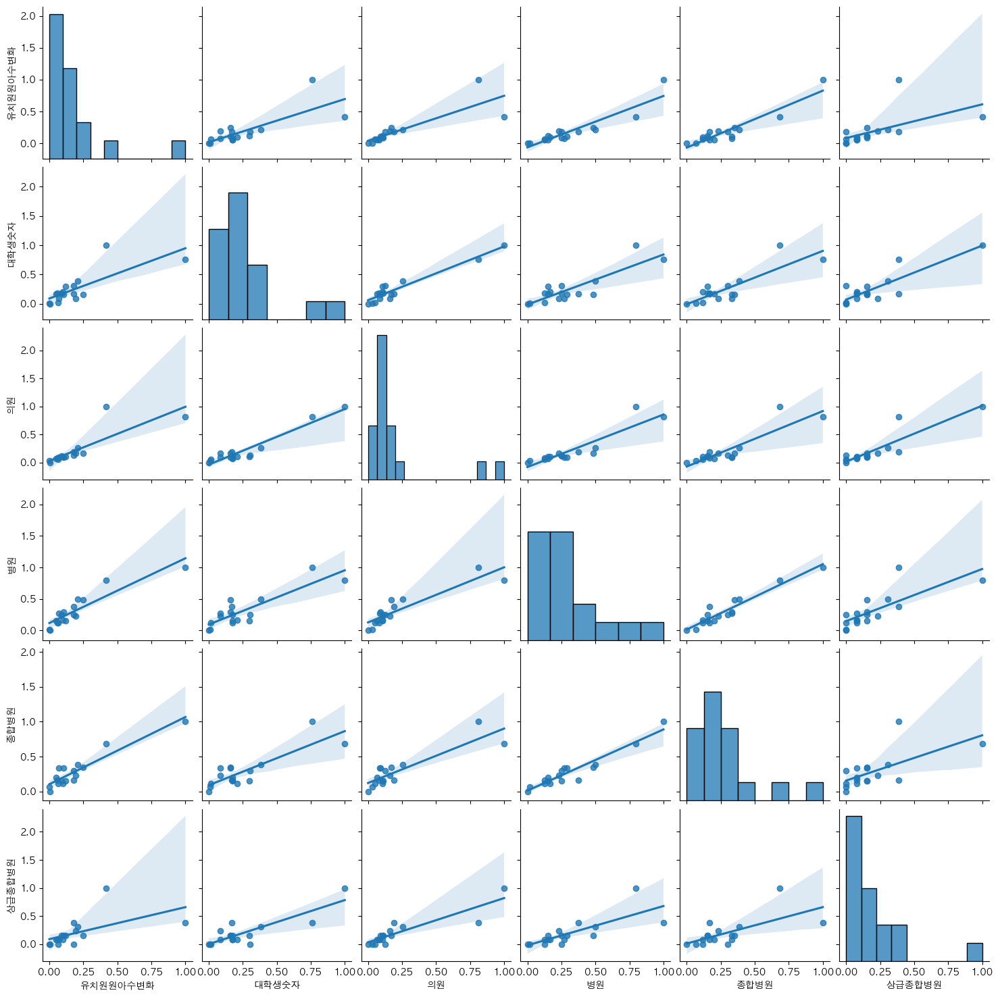

In [10]:
# 총 인구, 남성 인구, 여성 인구, 주택수, 빈집수, 자동차등록대수, 전입인구, 전출인구에 대한 상관관계 시각화
sns.pairplot(
    df_2020_norm,
    # vars = df_2020_norm.columns[:5],
    vars = df_2020_norm.columns[5:11],
    # vars = df_2020_norm.columns[:5],
    kind = 'reg'
)
plt.show()

In [14]:
target_col = df_2020_norm.columns
plt.figure(figsize=(100,100))
sns.heatmap(
    df_2020_norm[target_col].corr(),
    annot = True, # True로 해야 숫자가 보임
    fmt = 'f', # 실수
    linewidth = 0.5
)
plt.title('__')
plt.xticks(rotation=45)
plt.show()

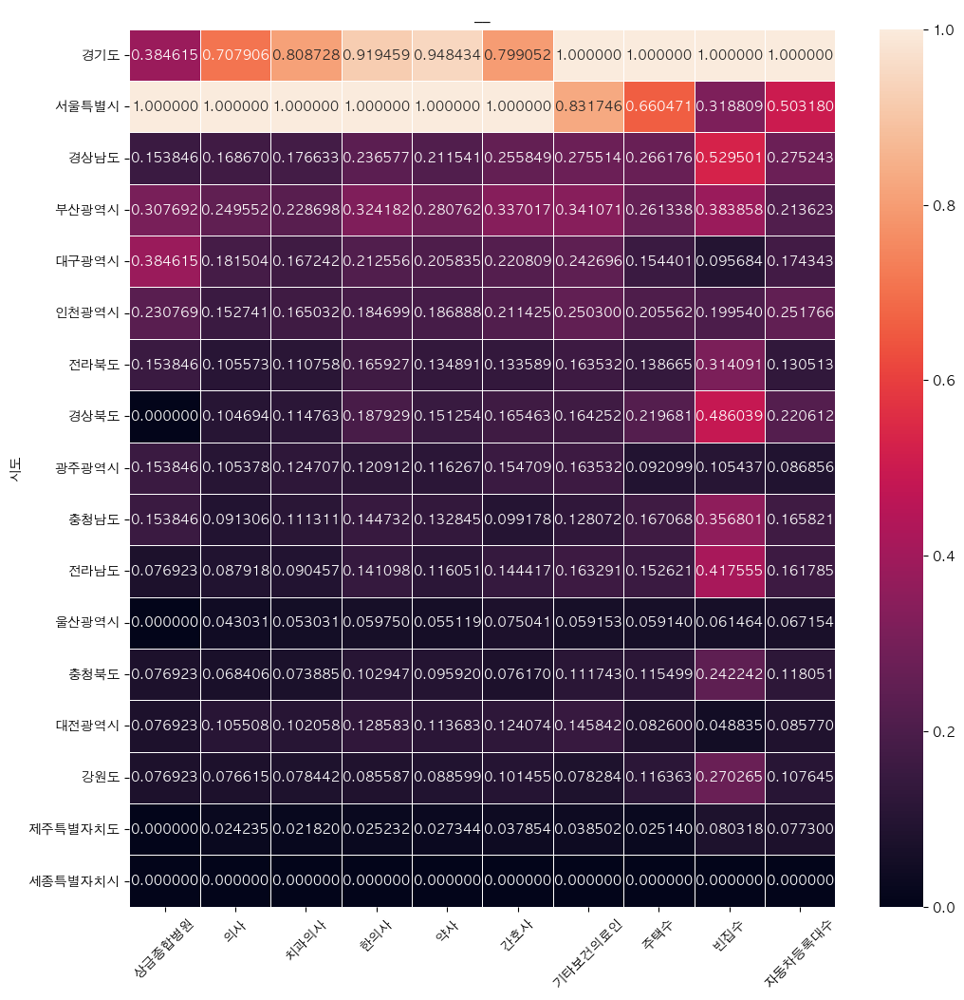

In [12]:
target_col = df_2020_norm.columns[10:20]
plt.figure(figsize=(12,12))
sns.heatmap(
    df_2020_norm[target_col],
    annot = True, # True로 해야 숫자가 보임
    fmt = 'f', # 실수
    linewidth = 0.5
)
plt.title('__')
plt.xticks(rotation=45)
plt.show()

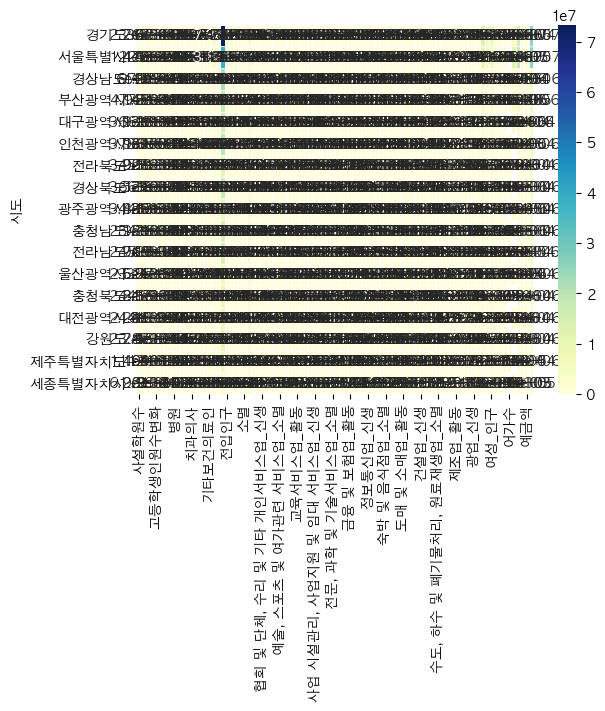

In [13]:
sns.heatmap(
    df_2020,
    annot=True,
    # fmt='d', # decimal
    cmap='YlGnBu',
    linewidth = 0.5,
    cbar=True # False하면 안보이게함
)
plt.show()